# SIFT Feature Matching with RANSAC

This notebook demonstrates SIFT feature detection and matching between two images, comparing results with and without RANSAC.

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import random
import os

# Import required functions from sift_useful.py
from sift_useful import ( 
    match_descriptors, ransac_match, visualize_keypoints, visualize_matches, sift
)

## Load and Process Images

In [6]:
def load_images(img_path1, img_path2):
    """
    Load two images for feature matching
    """
    # Load images
    img1 = cv2.imread(img_path1)
    img2 = cv2.imread(img_path2)
    
    # Convert from BGR to RGB for visualization
    img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
    
    # Convert to grayscale for feature detection
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    
    return img1_rgb, img2_rgb, img1_gray, img2_gray

def display_images(img1, img2, title1="Image 1", title2="Image 2"):
    """
    Display two images side by side
    """
    plt.figure(figsize=(16, 8))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img1)
    plt.title(title1)
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(img2)
    plt.title(title2)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

## Feature Detection and Matching

In [7]:
def detect_and_match_features(img1_gray, img2_gray, num_octaves=4, scales_per_octave=4, 
                             contrast_threshold=0.6, edge_threshold=10, ratio_threshold=0.75):
    """
    Detect SIFT features in both images and match them
    """
    # Extract keypoints and descriptors
    keypoints1, descriptors1 = sift(img1_gray, num_octaves, scales_per_octave, contrast_threshold, edge_threshold)
    keypoints2, descriptors2 = sift(img2_gray, num_octaves, scales_per_octave, contrast_threshold, edge_threshold)
    
    # Match descriptors
    matches = match_descriptors(descriptors1, descriptors2, ratio_threshold)
    
    print(f"Image 1: {len(keypoints1)} keypoints")
    print(f"Image 2: {len(keypoints2)} keypoints")
    print(f"Total matches: {len(matches)}")
    
    return keypoints1, keypoints2, matches

## Compare Matching With and Without RANSAC

In [8]:
def compare_ransac_matching(img1_rgb, img2_rgb, keypoints1, keypoints2, matches, 
                          num_iterations=1000, inlier_threshold=10):
    """
    Compare feature matching with and without RANSAC
    """
    # Apply RANSAC
    ransac_matches, homography = ransac_match(keypoints1, keypoints2, matches, 
                                             num_iterations, inlier_threshold)
    
    print(f"RANSAC inliers: {len(ransac_matches)} out of {len(matches)} matches")
    print(f"Inlier ratio: {len(ransac_matches)/len(matches)*100:.2f}%")
    
    # Create a figure to display both results
    plt.figure(figsize=(20, 10))
    
    # Display matches without RANSAC
    plt.subplot(1, 2, 1)
    plt.title(f"Without RANSAC: {len(matches)} matches")
    visualize_matches_in_subplot(img1_rgb, keypoints1, img2_rgb, keypoints2, matches)
    
    # Display matches with RANSAC
    plt.subplot(1, 2, 2)
    plt.title(f"With RANSAC: {len(ransac_matches)} inliers")
    visualize_matches_in_subplot(img1_rgb, keypoints1, img2_rgb, keypoints2, ransac_matches)
    
    plt.tight_layout()
    plt.show()
    
    return ransac_matches, homography

def visualize_matches_in_subplot(img1, kp1, img2, kp2, matches):
    """
    Visualize matches between two images in a subplot
    """
    # Create a new image with both images side by side
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    h = max(h1, h2)
    w = w1 + w2
    
    # Convert to grayscale if needed for visualization
    img1_gray = img1 if len(img1.shape) == 2 else cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    img2_gray = img2 if len(img2.shape) == 2 else cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
    
    vis = np.zeros((h, w, 3), dtype=np.uint8)
    
    # Place the images side by side
    if len(img1.shape) == 3:  # Color image
        vis[:h1, :w1] = img1
    else:  # Grayscale image
        vis[:h1, :w1, 0] = vis[:h1, :w1, 1] = vis[:h1, :w1, 2] = img1_gray
        
    if len(img2.shape) == 3:  # Color image
        vis[:h2, w1:w1+w2] = img2
    else:  # Grayscale image
        vis[:h2, w1:w1+w2, 0] = vis[:h2, w1:w1+w2, 1] = vis[:h2, w1:w1+w2, 2] = img2_gray
    
    plt.imshow(vis)
    
    # Create color map
    colors = plt.cm.hsv(np.linspace(0, 1, len(matches)))
    
    # Draw lines between matches
    for i, match in enumerate(matches):
        idx1, idx2 = match
        x1, y1 = kp1[idx1][0], kp1[idx1][1]
        x2, y2 = kp2[idx2][0] + w1, kp2[idx2][1]
        
        # Use a different color for each line
        plt.plot([x1, x2], [y1, y2], color=colors[i%len(colors)], linewidth=1)
        plt.plot(x1, y1, 'o', color=colors[i%len(colors)], markersize=3)
        plt.plot(x2, y2, 'o', color=colors[i%len(colors)], markersize=3)
    
    plt.axis('off')

## Test with Sample Images

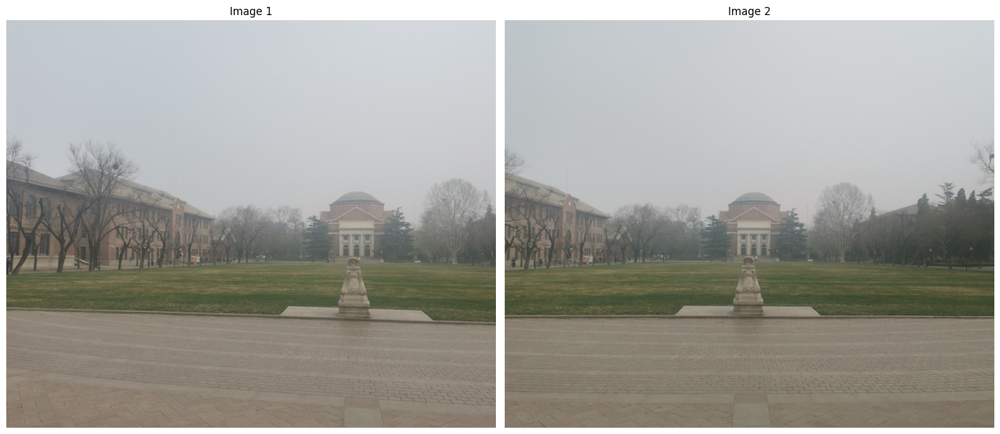

In [9]:
# Specify the paths to your images here
image_path1 = "building_2.jpg"  # Replace with your image path
image_path2 = "building_3.jpg"  # Replace with your image path

# Load and display images
img1_rgb, img2_rgb, img1_gray, img2_gray = load_images(image_path1, image_path2)
display_images(img1_rgb, img2_rgb, "Image 1", "Image 2")

Initial Shape:  (500, 600)
find keypoints in octave:  0  keypoints number:  126
find keypoints in octave:  1  keypoints number:  187
find keypoints in octave:  2  keypoints number:  43
find keypoints in octave:  3  keypoints number:  4
total keypoints number:  360
Initial Shape:  (500, 600)
find keypoints in octave:  0  keypoints number:  255
find keypoints in octave:  1  keypoints number:  153
find keypoints in octave:  2  keypoints number:  26
find keypoints in octave:  3  keypoints number:  4
total keypoints number:  438
Image 1: 392 keypoints
Image 2: 484 keypoints
Total matches: 61


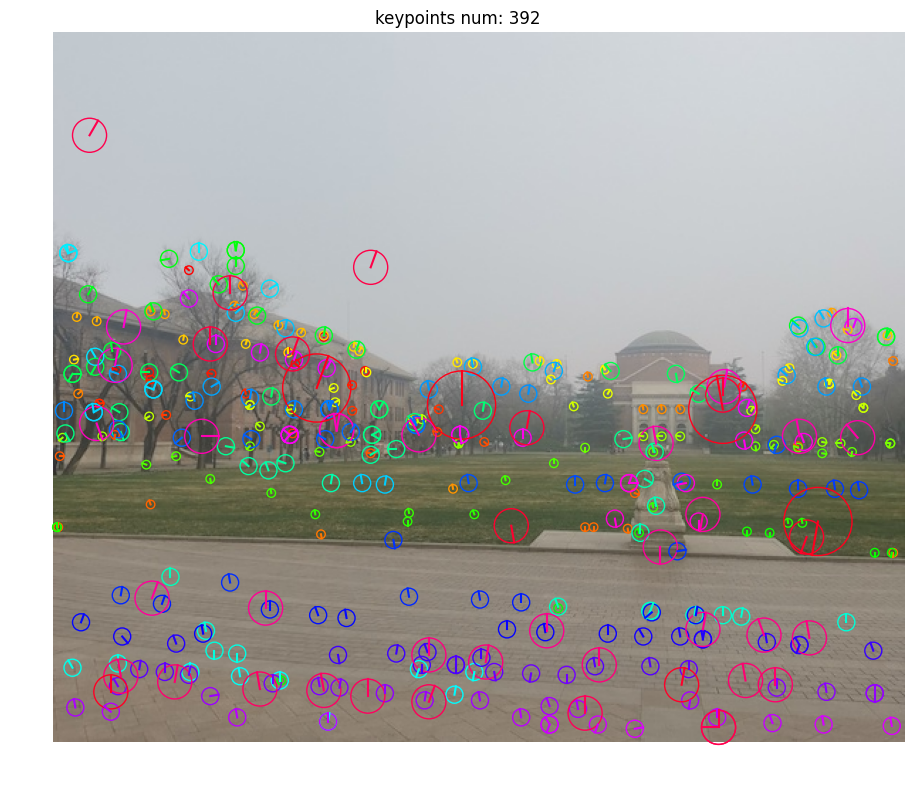

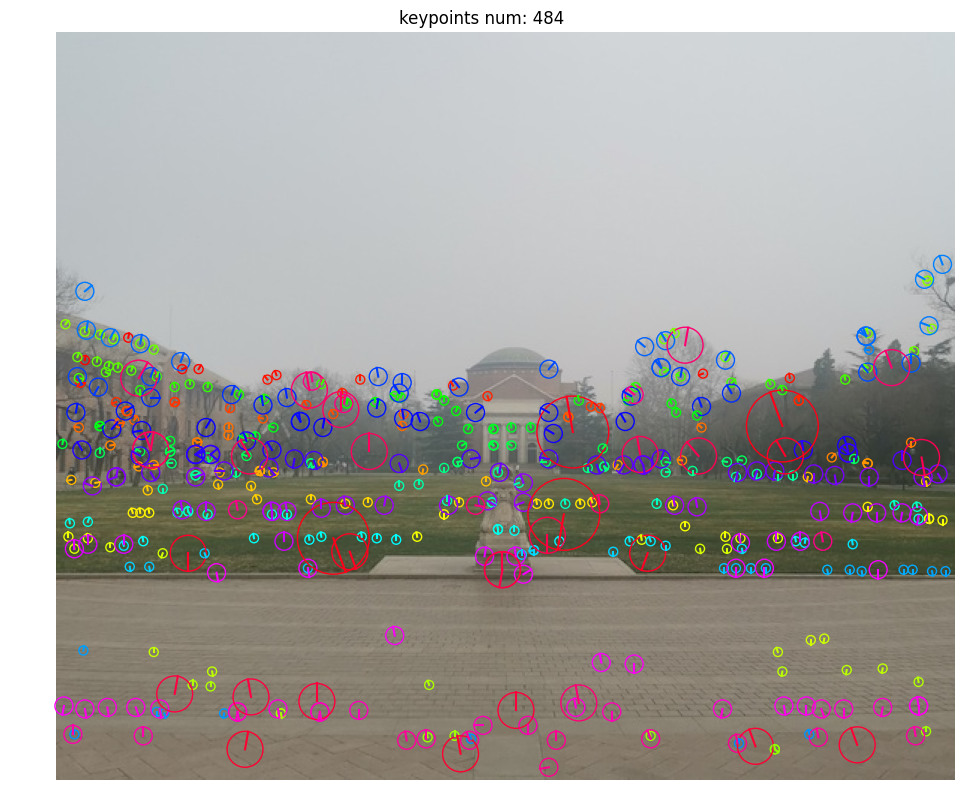

In [10]:
# Detect and match features
keypoints1, keypoints2, matches = detect_and_match_features(img1_gray, img2_gray, num_octaves=4, scales_per_octave=4, contrast_threshold=0.6, edge_threshold=10, ratio_threshold=0.75)

# Show some keypoints
visualize_keypoints(img1_rgb, keypoints1) 
visualize_keypoints(img2_rgb, keypoints2)  

RANSAC inliers: 57 out of 61 matches
Inlier ratio: 93.44%


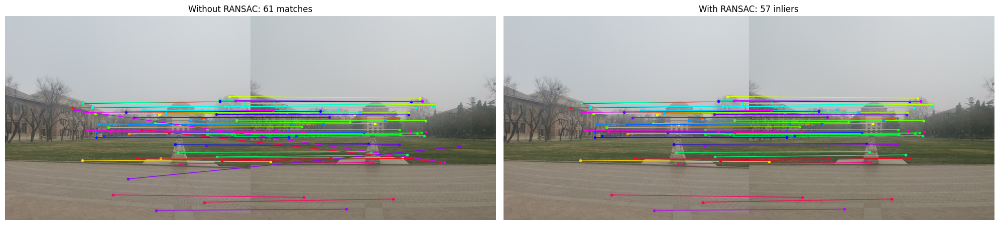

In [11]:
# Compare matching with and without RANSAC
ransac_matches, homography = compare_ransac_matching(img1_rgb, img2_rgb, keypoints1, keypoints2, matches)

## Image Registration with Homography (Optional)

In [28]:
def warp_image(img1, img2, homography):
    """
    Warp img1 to align with img2 using the homography matrix
    """
    if homography is None:
        print("No valid homography found")
        return
    
    # Get image dimensions
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Define the corners of img1
    corners = np.array([[0, 0], [0, h1], [w1, h1], [w1, 0]], dtype=np.float32).reshape(-1, 1, 2)
    
    # Transform the corners using the homography
    transformed_corners = cv2.perspectiveTransform(corners, homography)
    
    # Find the min and max x, y coordinates
    min_x = min(np.min(transformed_corners[:, 0, 0]), 0)
    min_y = min(np.min(transformed_corners[:, 0, 1]), 0)
    max_x = max(np.max(transformed_corners[:, 0, 0]), w2)
    max_y = max(np.max(transformed_corners[:, 0, 1]), h2)
    
    # Create a translation matrix to shift the result
    translation = np.array([[1, 0, -min_x], [0, 1, -min_y], [0, 0, 1]])
    
    # Combine the homography with the translation
    warp_matrix = translation @ homography
    
    # Define the output size of the warped image
    output_width = int(max_x - min_x)
    output_height = int(max_y - min_y)
    
    # Warp img1 using the combined matrix
    warped_img1 = cv2.warpPerspective(img1, warp_matrix, (output_width, output_height))
    
    # Create a canvas for img2 of the same size
    img2_canvas = np.zeros((output_height, output_width, 3), dtype=np.uint8)
    img2_canvas[-int(min_y):h2-int(min_y), -int(min_x):w2-int(min_x)] = img2
    
    # Display the results
    plt.figure(figsize=(20, 10))
    
    plt.subplot(1, 3, 1)
    plt.title("Original Image 1")
    plt.imshow(img1)
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.title("Warped Image 1")
    plt.imshow(warped_img1)
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.title("Image 2")
    plt.imshow(img2_canvas)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # # Create a blended result
    # alpha = 0.5
    # beta = 1.0 - alpha
    # blended = cv2.addWeighted(warped_img1, alpha, img2_canvas, beta, 0.0)
    # strategy: If the pixel are duplicated, take the average of the pixel values
    # 修正后的平均融合方法
# 获取两图的非零区域掩码（只要有一个通道非零即视为有效像素）
    mask1 = warped_img1.any(axis=2)  
    mask2 = img2_canvas.any(axis=2)
    overlap_mask = mask1 & mask2  # 重叠区域

# 初始化结果图像（直接相加非重叠区域）
    blended = warped_img1.copy()
    blended[~mask1] = img2_canvas[~mask1]  # 填充img2独有的区域

# 对重叠区域进行平均（避免uint8溢出）
    blended_overlap = cv2.addWeighted(warped_img1, 0.5, img2_canvas, 0.5, 0)
    blended[overlap_mask] = blended_overlap[overlap_mask]
    
    plt.figure(figsize=(12, 10))
    plt.title("Blended Result")
    plt.imshow(blended)
    plt.axis('off')
    plt.show()
    
    return warped_img1, img2_canvas, blended, overlap_mask

# 修正后的边缘检测代码
def optimize_boundary(blended, warped_img1, img2_canvas, overlap_mask):
    # 转换为灰度图（关键修复1）
    gray1 = cv2.cvtColor(warped_img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2_canvas, cv2.COLOR_BGR2GRAY)
    
    # 边缘检测（调整阈值）
    edges1 = cv2.Canny(gray1, threshold1=100, threshold2=200)
    edges2 = cv2.Canny(gray2, threshold1=100, threshold2=200)
    
    # 合并边缘并二值化（关键修复2）
    edge_mask = cv2.bitwise_or(edges1, edges2) > 0  # 转为布尔型
    
    # 膨胀操作（调整核大小）
    edge_mask = cv2.dilate(
        edge_mask.astype(np.uint8)*255, 
        kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    ) > 0

    # 计算实际边缘像素数（关键修复3）
    edge_pixels = np.sum(edge_mask)
    
    # 生成渐变权重
    grad_weight = np.zeros_like(overlap_mask, dtype=np.float32)
    grad_weight[overlap_mask] = 0.5
    
    if edge_pixels > 0:
        # 使用正确像素数生成渐变（关键修复4）
        grad_weight[edge_mask] = np.linspace(0.3, 0.7, edge_pixels)
    
    # 维度调整（适应OpenCV要求）
    grad_weight_3d = np.repeat(grad_weight[:, :, np.newaxis], 3, axis=2)
    
    # 加权融合
    blended = cv2.addWeighted(
        warped_img1, grad_weight_3d,
        img2_canvas, 1 - grad_weight_3d,
        0
    )
    
    # 后处理优化
    blended = cv2.medianBlur(blended, 3)
    return blended



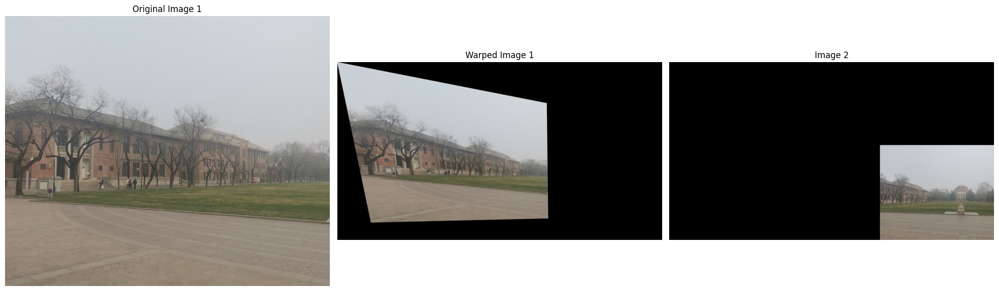

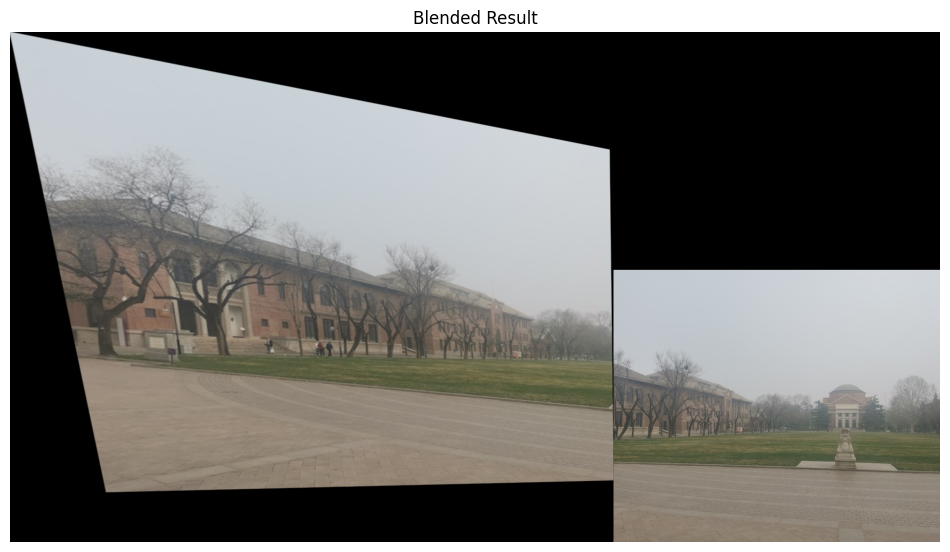

'\nblended_optimized = optimize_boundary(blended, warped_img1, img2_canvas, overlap_mask)\nplt.figure(figsize=(12, 10))\nplt.title("Optimized Blended Result")\nplt.imshow(blended_optimized)\nplt.axis(\'off\')\nplt.show()\'\n'

In [29]:
# Try warping the image if homography is available
if homography is not None:
    warped_img1, img2_canvas, blended, overlap_mask = warp_image(img1_rgb, img2_rgb, homography)

'''
blended_optimized = optimize_boundary(blended, warped_img1, img2_canvas, overlap_mask)
plt.figure(figsize=(12, 10))
plt.title("Optimized Blended Result")
plt.imshow(blended_optimized)
plt.axis('off')
plt.show()'
'''

## Do the 4 images sythesize

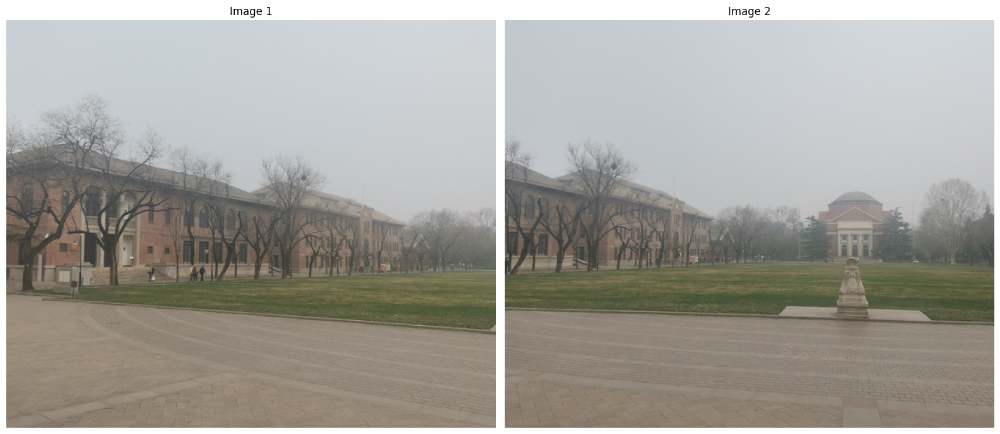

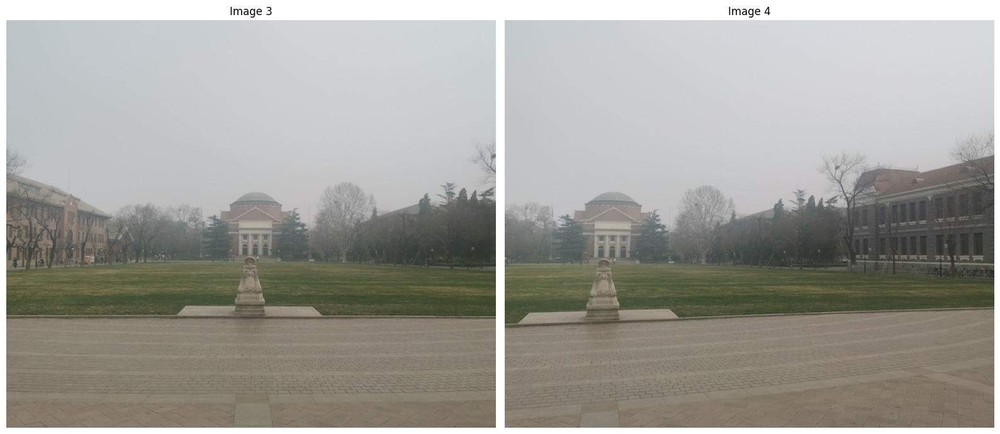

In [30]:
image_path1 = "building_1.jpg"  # Replace with your image path
image_path2 = "building_2.jpg"  # Replace with your image path
image_path3 = "building_3.jpg"  # Replace with your image path
image_path4 = "building_4.jpg"  # Replace with your image path

# Load and display images
img1_rgb, img2_rgb, img1_gray, img2_gray = load_images(image_path1, image_path2)
display_images(img1_rgb, img2_rgb, "Image 1", "Image 2")
img3_rgb, img4_rgb, img3_gray, img4_gray = load_images(image_path3, image_path4)
display_images(img3_rgb, img4_rgb, "Image 3", "Image 4")

Initial Shape:  (500, 600)
find keypoints in octave:  0  keypoints number:  3753
find keypoints in octave:  1  keypoints number:  16
find keypoints in octave:  2  keypoints number:  12
find keypoints in octave:  3  keypoints number:  6
total keypoints number:  3787
Initial Shape:  (500, 600)
find keypoints in octave:  0  keypoints number:  126
find keypoints in octave:  1  keypoints number:  187
find keypoints in octave:  2  keypoints number:  43
find keypoints in octave:  3  keypoints number:  4
total keypoints number:  360
Image 1: 4339 keypoints
Image 2: 392 keypoints
Total matches: 82
Initial Shape:  (500, 600)
find keypoints in octave:  0  keypoints number:  193
find keypoints in octave:  1  keypoints number:  161
find keypoints in octave:  2  keypoints number:  12
find keypoints in octave:  3  keypoints number:  4
total keypoints number:  370
Initial Shape:  (500, 600)
find keypoints in octave:  0  keypoints number:  255
find keypoints in octave:  1  keypoints number:  153
find k

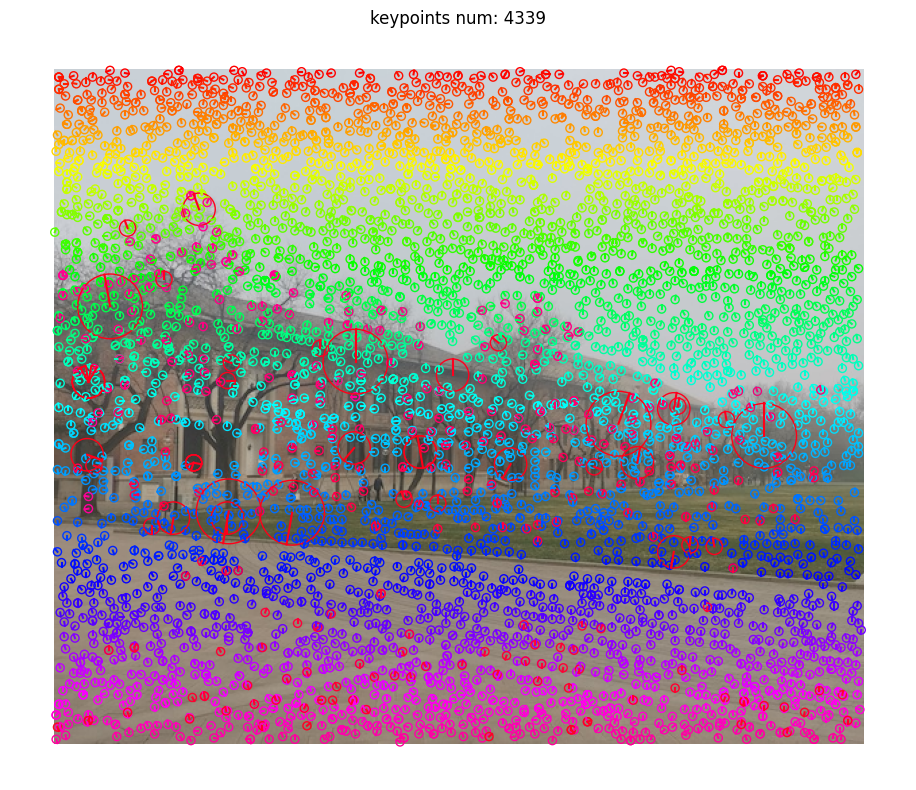

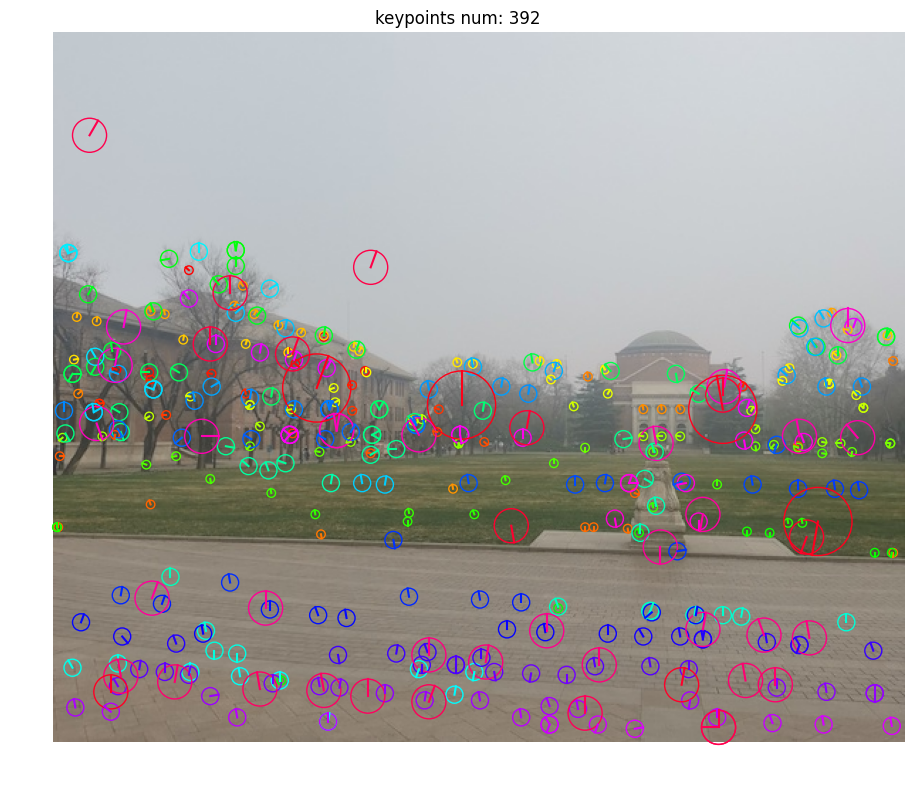

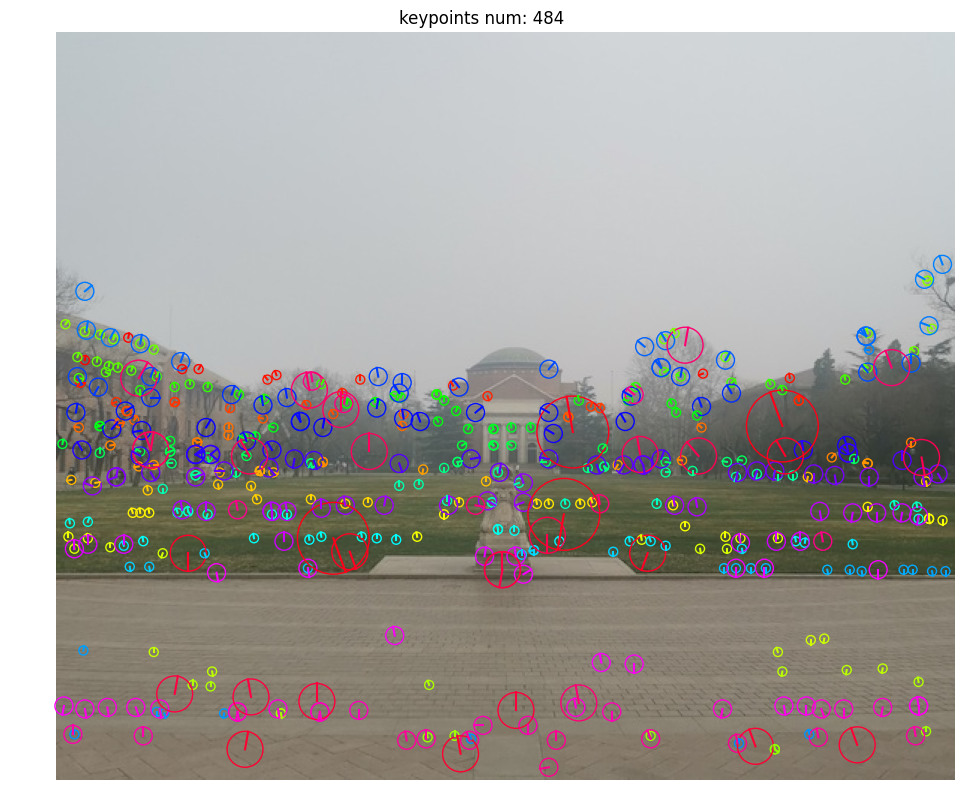

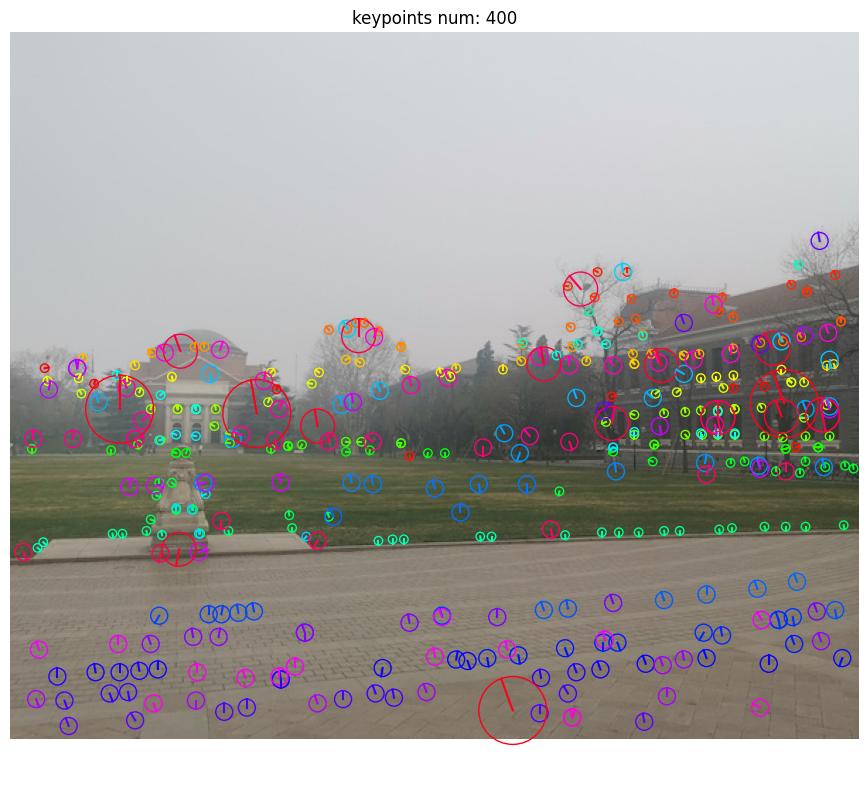

In [31]:
# Detect and match features
keypoints1, keypoints2, matches = detect_and_match_features(img1_gray, img2_gray, num_octaves=4, scales_per_octave=4, contrast_threshold=0.6, edge_threshold=10, ratio_threshold=0.75)
keypoints4, keypoints3,  matches2 = detect_and_match_features(img4_gray, img3_gray, num_octaves=4, scales_per_octave=4, contrast_threshold=0.6, edge_threshold=10, ratio_threshold=0.75)

# Show some keypoints
visualize_keypoints(img1_rgb, keypoints1) 
visualize_keypoints(img2_rgb, keypoints2)  
visualize_keypoints(img3_rgb, keypoints3)
visualize_keypoints(img4_rgb, keypoints4)

RANSAC inliers: 41 out of 82 matches
Inlier ratio: 50.00%


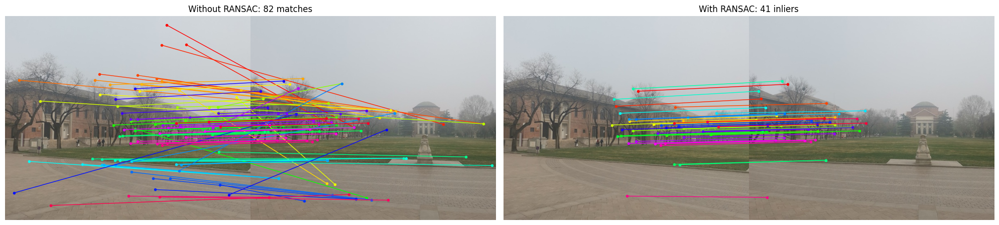

RANSAC inliers: 63 out of 70 matches
Inlier ratio: 90.00%


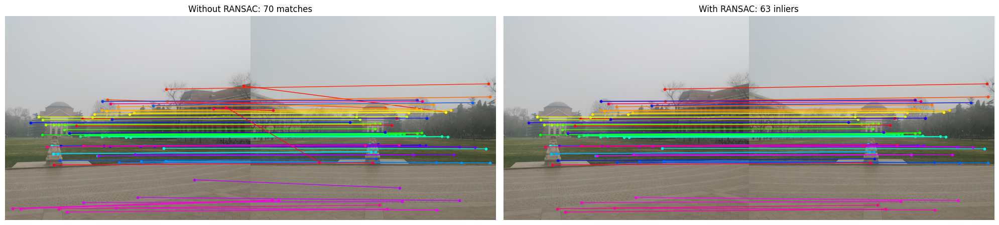

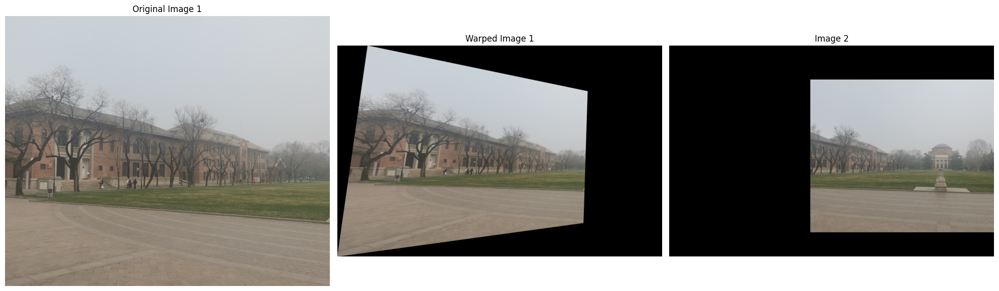

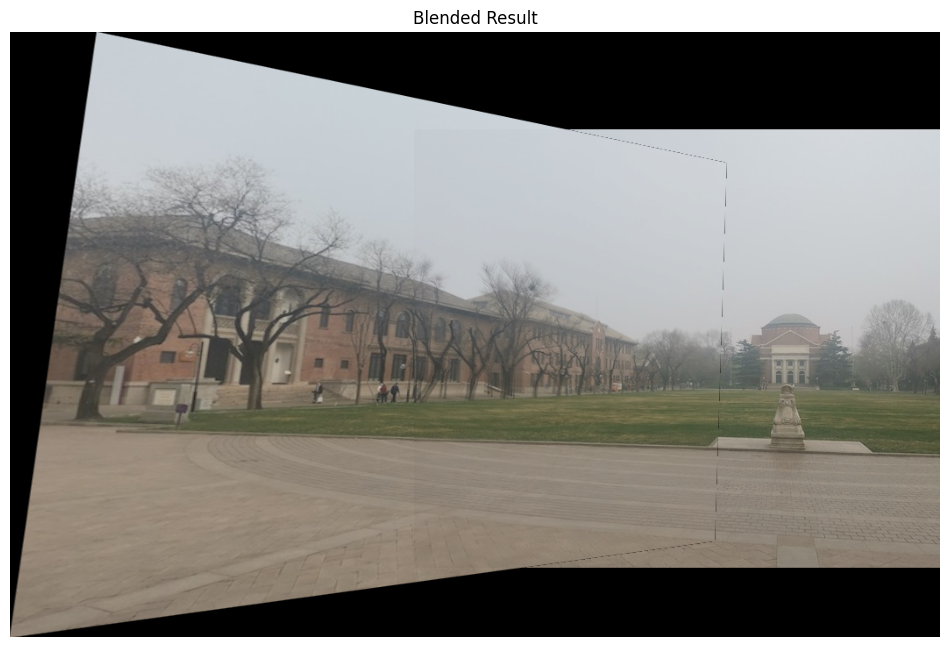

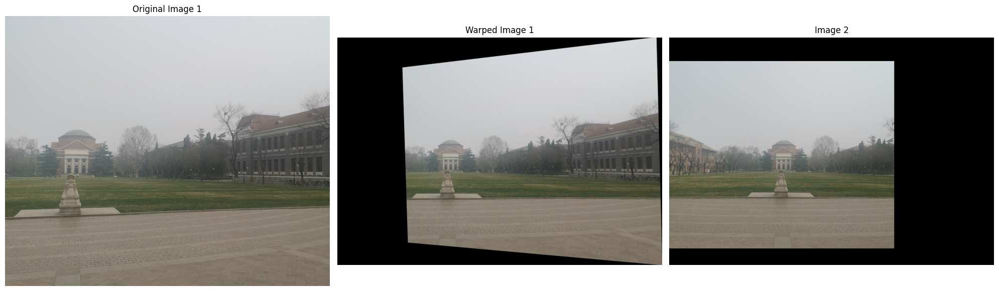

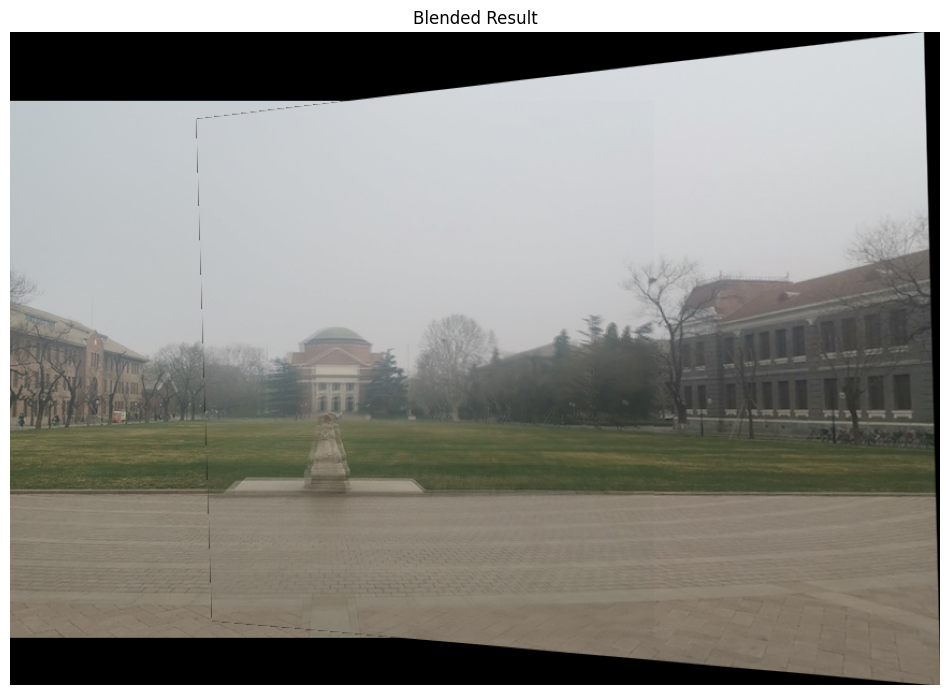

In [32]:
# Compare matching with and without RANSAC
ransac_matches, homography = compare_ransac_matching(img1_rgb, img2_rgb, keypoints1, keypoints2, matches)
ransac_matches2, homography2 = compare_ransac_matching(img4_rgb,img3_rgb, keypoints4,  keypoints3, matches2)
warped_img1, img2_canvas, blended, overlap_mask = warp_image(img1_rgb, img2_rgb, homography)
img4_canvas, warped_img3, blended2, overlap_mask2 = warp_image(img4_rgb, img3_rgb, homography2)

Initial Shape:  (690, 1061)
find keypoints in octave:  0  keypoints number:  303
find keypoints in octave:  1  keypoints number:  430
find keypoints in octave:  2  keypoints number:  17
find keypoints in octave:  3  keypoints number:  9
total keypoints number:  759
Initial Shape:  (608, 866)
find keypoints in octave:  0  keypoints number:  806
find keypoints in octave:  1  keypoints number:  32
find keypoints in octave:  2  keypoints number:  40
find keypoints in octave:  3  keypoints number:  2
total keypoints number:  880
Image 1: 854 keypoints
Image 2: 952 keypoints
Total matches: 66
RANSAC inliers: 45 out of 66 matches
Inlier ratio: 68.18%


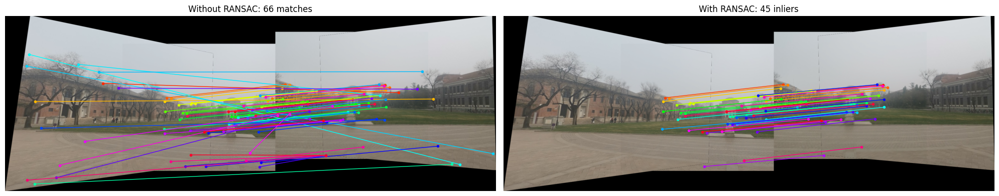

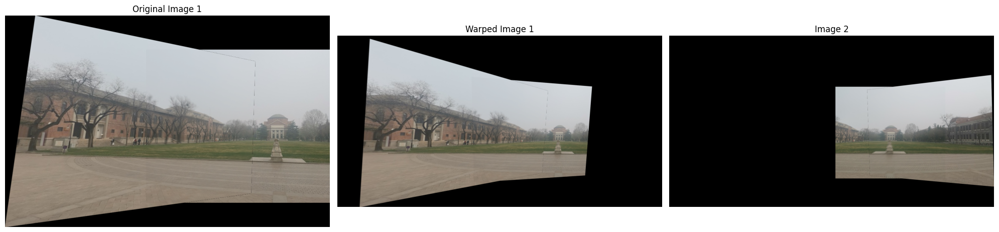

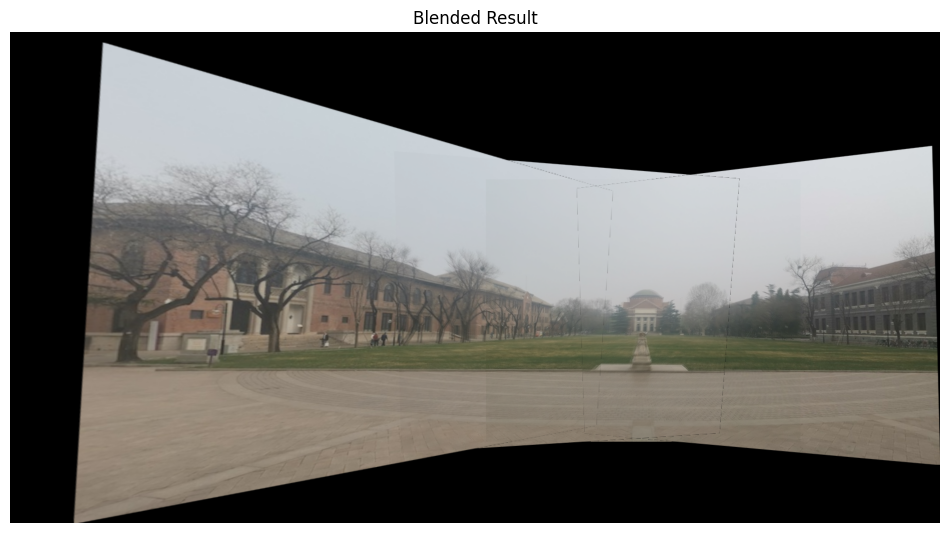

In [33]:
img1_gray = blended
img2_gray = blended2
keypoints1, keypoints2, matches = detect_and_match_features(img1_gray, img2_gray, num_octaves=4, scales_per_octave=4, contrast_threshold=0.40, edge_threshold=10, ratio_threshold=0.75)
ransac_matches, homography = compare_ransac_matching(img1_gray, img2_gray, keypoints1, keypoints2, matches)
warped_img1, img2_canvas, blended, overlap_mask = warp_image(img1_gray, img2_gray, homography)

## Conclusion

This notebook demonstrated how to use SIFT for feature detection and matching between two images, comparing the results with and without RANSAC. RANSAC helps filter out incorrect matches by finding a consistent transformation (homography) between the images.

Key observations:
1. Regular feature matching may include many incorrect matches
2. RANSAC effectively filters out these outliers
3. The resulting homography can be used for image alignment and stitching